In [ ]:
# Start writing code here...

In [ ]:
import sys
sys.path.append('..')

import os
import pickle

import numpy as np
import pandas as pd

from lib.viz import chart_feature_target_relation, create_correlation_scatters, get_feature_target_correlation, create_feature_target_heatmap


from lib.viz import draw_missing_data_chart, draw_corr_heatmap, draw_components_variance_chart
from lib.read_data import read_feature_files, read_and_join_output_file, combine_datasets

%matplotlib inline


/shared-libs/python3.9/py/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


### Study the Feature to Target Variable Relationship

In [ ]:
dir_path = "../assets/train_test_target_shifted/"
with open(f'{dir_path}train_test_dict_target_shifted.pickle', 'rb') as file:
        train_test_dict = pickle.load( file)
X_train_impute = train_test_dict['X_train_impute']
X_test_impute = train_test_dict['X_test_impute']
y_train = train_test_dict['y_train']
y_test = train_test_dict['y_test']
y_pred = train_test_dict['y_pred']


with open(f'{dir_path}X_train_impute_target_shifted_df.pkl', 'rb') as file:
        X_train_impute_df = pickle.load( file)
with open(f'{dir_path}X_test_impute_target_shifted_df.pkl', 'rb') as file:
        X_test_impute_df = pickle.load( file)

train_with_target_df = combine_datasets(X_train_impute_df, y_train, 'GSE_GWE_SHIFTED')
test_with_target_df = combine_datasets(X_test_impute_df, y_test, 'GSE_GWE_SHIFTED')
full_df = train_with_target_df.append(test_with_target_df)
full_df.set_index(['TOWNSHIP_RANGE', 'YEAR'], inplace=True)

In [ ]:
train_test_dict.keys()

dict_keys(['X_train_impute', 'X_test_impute', 'X_pred_impute', 'y_train', 'y_test', 'y_pred'])

Text(0.5, 1.0, 'Features Correlating with GSE_GWE_SHIFTED')

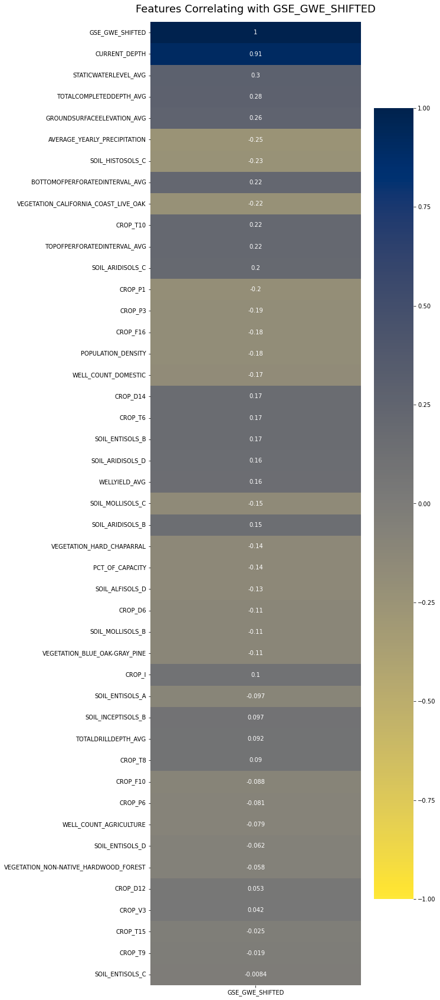

In [ ]:
create_feature_target_heatmap(full_df, target='GSE_GWE_SHIFTED', sort_by_absolute=True)

### Feature to target correlation observation

Note: The highest correlation of the target is to the lagged version of the depth which is the CURRENT_DEPTH feature. Since this is the groundwater depth from previous year, this correlation is anticipated. We are looking into the predictive ability of additional features.

The correlation values are below at or below 0.3 for the other features. This indicates a very **low correlation of features with target in general**. The below is a discussion of relative correlation of features with target.

The target is related highly to well features in a township_range such as its completed depth and water level in the well. It is also influenced by the ground surface elevation of the township range. It is negatively correlated to the precipitation as might be expected since more precipitation will result in less depth at which groudwater can be found. It is also negatively correlated with population density.

Orions and Garlic (T10) and "alfalfa & alfalfa mixtures (P1) and Pistachios (D14) are also correlated with target more than other crops.

Text(0.5, 1.0, 'Features Correlating with GSE_GWE_SHIFTED')

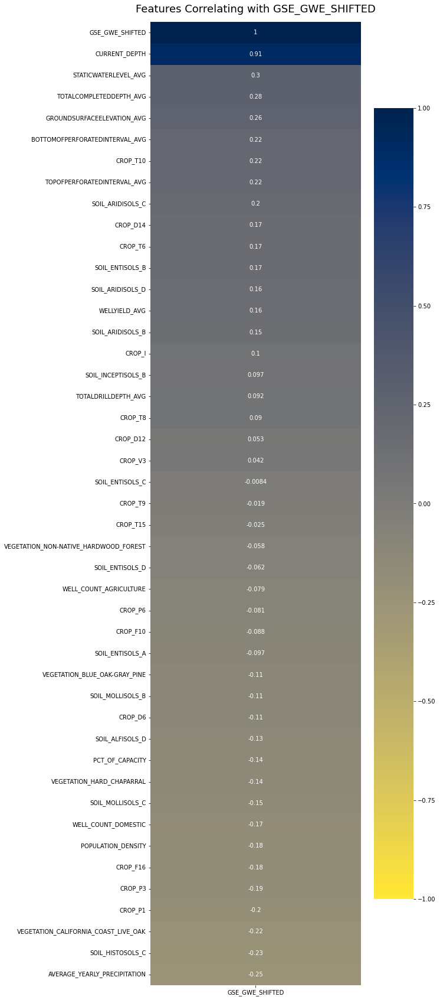

In [ ]:
create_feature_target_heatmap(full_df, target='GSE_GWE_SHIFTED', sort_by_absolute=False)

In [ ]:
draw_corr_heatmap(full_df.reset_index(), ['TOWNSHIP_RANGE', 'YEAR'])

alt.Chart(...)

##### Groundwater levels

- Observed below: a dip in the groundwater levels from 2015 through 2017, the drought years, 
- The current depth shows an increase until 2020 and followed by a drop in 2021, another severe drought year.

,TOWNSHIP_RANGE,YEAR,GSE_GWE_SHIFTED
0,T01N R02E,2014,56.027436
1,T01N R02E,2015,48.830000
2,T01N R02E,2016,48.007333
3,T01N R02E,2017,45.985000
4,T01N R02E,2018,45.781500
...,...,...,...
3341,T32S R26E,2020,220.866667
3342,T32S R27E,2020,151.778571
3343,T32S R28E,2020,174.023077
3344,T32S R29E,2020,326.627273


In [ ]:
import altair as alt
target_df = y_train.append(y_test).reset_index()
alt.Chart(
    target_df
).mark_bar(

).encode(
    x=alt.X('YEAR:N'),
    y=alt.Y('GSE_GWE_SHIFTED:Q'),
    color=alt.Color("TOWNSHIP_RANGE:N")
)


alt.Chart(...)

In [ ]:
for variable in [col for col in  X_train_impute_df.columns if col.startswith('WELL_')]:
    display(chart_feature_target_relation( X_train_impute_df, y_train, variable, 'GSE_GWE_SHIFTED'))

alt.LayerChart(...)

alt.LayerChart(...)

##### Wells
Agriculture (-0.167) and Domestic (-0.083) wells show the most variance and negative correlation to target.

In [ ]:
for variable in [col for col in  X_train_impute_df.columns if col.startswith('VEGETATION_')]:
    display(chart_feature_target_relation( X_train_impute_df, y_train, variable, 'GSE_GWE_SHIFTED'))

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

#### Vegetation

Vegetations CALIFORNIA_COAST_LIVE_OAK, PINYON_JUMPER, HARD_CHAPARAL show high correlation number in relation to the target but the data is sparse. Whereas VEGETATION_NON-NATIVE_HARDWOOD_FOREST does not indicate highly correlation co-efficient but the data is better distributed.

In [ ]:
for variable in [col for col in  X_train_impute_df.columns if col.startswith('SOIL_')]:
    display(chart_feature_target_relation( X_train_impute_df, y_train, variable, 'GSE_GWE_SHIFTED'))

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

In [ ]:
for variable in [col for col in X_train_impute_df if not col.startswith(('VEGETATION', 'SOIL', 'CROP', 'WELL'))]:
    display(chart_feature_target_relation( X_train_impute_df, y_train, variable, 'GSE_GWE_SHIFTED'))

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

In [ ]:
display(get_feature_target_correlation(X_train_impute_df, y_train, 'GSE_GWE_SHIFTED'))

,Correlation_Coefficient
GSE_GWE_SHIFTED,1.000000
CURRENT_DEPTH,0.909917
GROUNDSURFACEELEVATION_AVG,0.377220
STATICWATERLEVEL_AVG,0.321778
TOTALCOMPLETEDDEPTH_AVG,0.304203
AVERAGE_YEARLY_PRECIPITATION,-0.257602
SOIL_HISTOSOLS_C,-0.243636
VEGETATION_CALIFORNIA_COAST_LIVE_OAK,-0.242984
BOTTOMOFPERFORATEDINTERVAL_AVG,0.239718
TOPOFPERFORATEDINTERVAL_AVG,0.237114


### Correlation of test features with target


In [ ]:
display(get_feature_target_correlation(X_test_impute_df, y_test, 'GSE_GWE_SHIFTED'))

,Correlation_Coefficient
GSE_GWE_SHIFTED,1.000000
CURRENT_DEPTH,0.915789
SOIL_ARIDISOLS_B,-0.286659
PCT_OF_CAPACITY,0.208639
CROP_D12,-0.195448
POPULATION_DENSITY,-0.193293
WELL_COUNT_DOMESTIC,-0.175536
GROUNDSURFACEELEVATION_AVG,-0.173942
AVERAGE_YEARLY_PRECIPITATION,-0.170705
VEGETATION_BLUE_OAK-GRAY_PINE,0.151698


In [ ]:
for variable in [col for col in X_test_impute_df if not col.startswith(('VEGETATION', 'SOIL', 'CROP', 'WELL'))]:
    display(chart_feature_target_relation( X_test_impute_df, y_test, variable, 'GSE_GWE_SHIFTED'))

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b042e2da-6536-449d-95b8-d85fa08825de' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>